# Engagement Analysis for Practice for work skills test

## Exploratory Data Analysis / Pre-Processing:

### Read the data, clean/encode datatypes, transorm the data to get response/dependent variable
- Decide on the response variable using the objective
- Finalize the set of final independent and dependent variables based on the EDA

In [1]:
%matplotlib inline
import json
import pandas as pd
import numpy as np
import datetime as dt
import statsmodels.api as sm
import seaborn as sns
import datetime as dt
import matplotlib.pyplot as plt
import plotly.express as px
from fast_ml import eda
from fast_ml.model_development import train_valid_test_split
from fast_ml.missing_data_imputation import MissingDataImputer_Numerical, MissingDataImputer_Categorical
from fast_ml.outlier_treatment import OutlierTreatment
from fast_ml.feature_engineering import FeatureEngineering_DateTime, FeatureEngineering_Categorical, FeatureEngineering_Numerical
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import preprocessing
from sklearnex import patch_sklearn
from IPython.core.display import display, HTML

display(HTML("<style>.container { width:75% !important; }</style>"))
pd.options.display.float_format = "{:.4f}".format
sns.set_style('white')
sns.set(rc={'figure.figsize':(12,9)})

patch_sklearn()

def transform_for_response_variable(df):
    if 'Response' in df.columns:
        return df
    else:
        # build a response variable in the dataframe of relevant datatype
        pass

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


### Outlier visualization and handling
- For featured engineered or transformed variables, do not worry about the outliers.
- Similarly for response variable, do not worry about the outliers.
- Make sure the raw variables are handled for outliers
    - Decide on which raw variables make the outlier columns

In [2]:
# Read the dataset
df_data = pd.read_csv('./data/marketing_data.csv')

# Clean and encode the datatypes
# Strip the column header names for leading and trailing spaces
df_data.columns = [x.strip() for x in df_data.columns] 
# Encode the Year of birth and Date of customer enrollment columns as date time
df_data['Year_Birth'] = pd.to_datetime(df_data['Year_Birth'])
df_data['Dt_Customer'] = pd.to_datetime(df_data['Dt_Customer'])
# Encode the ID in the dataset as object
df_data['ID'] = df_data['ID'].astype(object)
# Encode Income as a float field
df_data['Income'] = df_data['Income'].str.replace(',','').str[1:].astype(float)

# If a variable named 'Response' already in the data set then return data set as is.
s_response = 'Response'
df_data = transform_for_response_variable(df_data)
print('Shape of the data: {}'.format(df_data.shape))
eda.df_info(df_data)

Shape of the data: (2240, 28)


,data_type,data_type_grp,num_unique_values,sample_unique_values,num_missing,perc_missing
ID,object,Categorical,2240,"[1826, 1, 10476, 1386, 5371, 7348, 4073, 1991,...",0,0.0000
Year_Birth,datetime64[ns],DateTime,59,"[1970, 1961, 1958, 1967, 1989, 1954, 1947, 197...",0,0.0000
Education,object,Categorical,5,"[Graduation, PhD, 2n Cycle, Master, Basic]",0,0.0000
Marital_Status,object,Categorical,8,"[Divorced, Single, Married, Together, Widow, Y...",0,0.0000
Income,float64,Numerical,1974,"[84835.0, 57091.0, 67267.0, 32474.0, 21474.0, ...",24,1.0714
Kidhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Teenhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Dt_Customer,datetime64[ns],DateTime,663,"[1402876800000000000, 1402790400000000000, 139...",0,0.0000
Recency,int64,Numerical,100,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]",0,0.0000
MntWines,int64,Numerical,776,"[189, 464, 134, 10, 6, 336, 769, 78, 384, 450]",0,0.0000


In [3]:
df_eda = eda.df_info(df_data)
ls_numerical_columns = list(df_eda[df_eda['data_type_grp'] == 'Numerical'].T.columns)
ls_categorical_columns = list(df_eda[df_eda['data_type_grp'] == 'Categorical'].T.columns)[1:]
ls_datetime_columns = list(df_eda[df_eda['data_type_grp'] == 'DateTime'].T.columns)

eda.numerical_check_outliers(df_data[ls_numerical_columns])

,lower_bound_outliers,upper_bound_outliers,total_outliers,perc_outliers
Response,0,334,334,14.9107
MntSweetProducts,0,248,248,11.0714
MntFruits,0,227,227,10.1339
MntFishProducts,0,223,223,9.9554
MntGoldProds,0,207,207,9.2411
MntMeatProducts,0,175,175,7.8125
AcceptedCmp4,0,167,167,7.4554
AcceptedCmp3,0,163,163,7.2768
AcceptedCmp5,0,163,163,7.2768
AcceptedCmp1,0,144,144,6.4286


In [4]:
ls_outlier_columns = ['Income', 'Complain', 'NumCatalogPurchases', 'NumWebVisitsMonth', 'NumWebPurchases']
eda.numerical_check_outliers(df_data[ls_outlier_columns])

,lower_bound_outliers,upper_bound_outliers,total_outliers,perc_outliers
NumCatalogPurchases,0,23,23,1.0268
Complain,0,21,21,0.9375
Income,0,8,8,0.3571
NumWebVisitsMonth,0,8,8,0.3571
NumWebPurchases,0,4,4,0.1786


<AxesSubplot:xlabel='Education', ylabel='Income'>

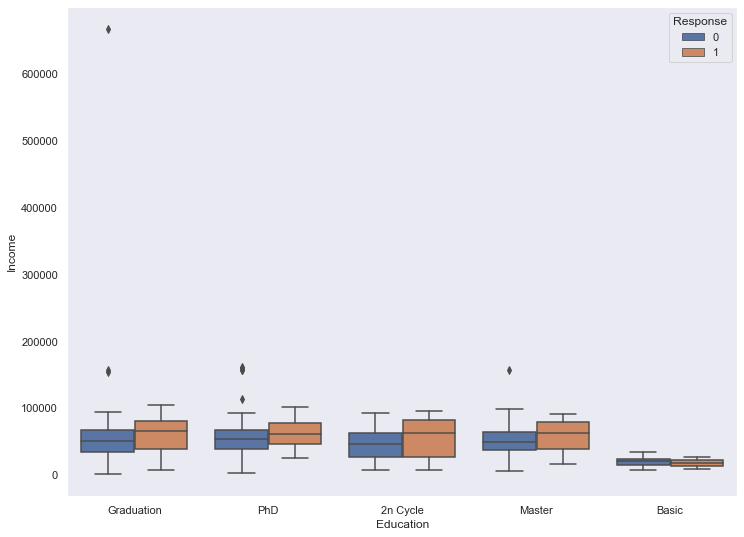

In [5]:
# Visualize a few of the outlier columns before outlier handling
sns.set_style('dark')
sns.boxplot(data=df_data, x='Education', y='Income', hue='Response')

<AxesSubplot:xlabel='Education', ylabel='NumCatalogPurchases'>

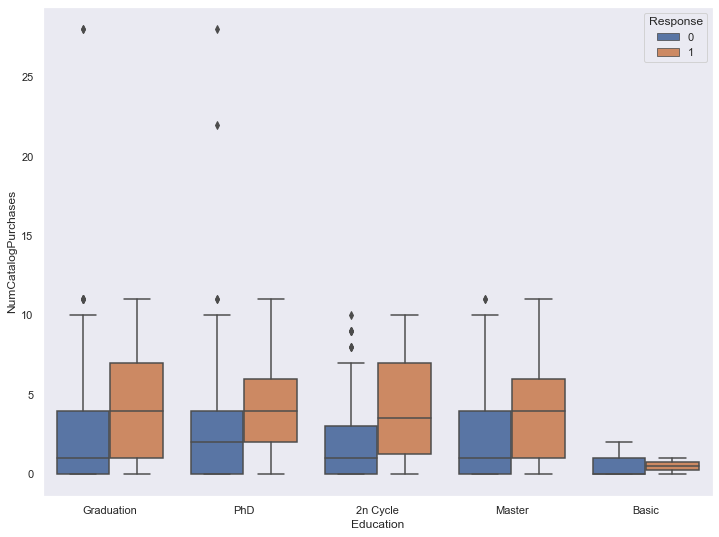

In [6]:
# Visualize a few of the outlier columns before outlier handling
sns.set_style('dark')
sns.boxplot(data=df_data, x='Education', y='NumCatalogPurchases', hue='Response')

In [7]:
outlier_obj = OutlierTreatment(method = 'iqr', tol=1.5)
outlier_obj.fit(df_data, ls_outlier_columns)

print('Parameters for Outlier treatment to fit for different outlier variables: {}'.format(outlier_obj.param_dict_))

#Scikit-learn type fit() transform() functionality
#Use fit() and transform() on the entire dataset for outlier handling
df_data = outlier_obj.transform(df_data)

Parameters for Outlier treatment to fit for different outlier variables: {'Income': {'lower_bound': -14525.5, 'upper_bound': 118350.5}, 'Complain': {'lower_bound': 0.0, 'upper_bound': 0.0}, 'NumCatalogPurchases': {'lower_bound': -6.0, 'upper_bound': 10.0}, 'NumWebVisitsMonth': {'lower_bound': -3.0, 'upper_bound': 13.0}, 'NumWebPurchases': {'lower_bound': -4.0, 'upper_bound': 12.0}}


<AxesSubplot:xlabel='Education', ylabel='Income'>

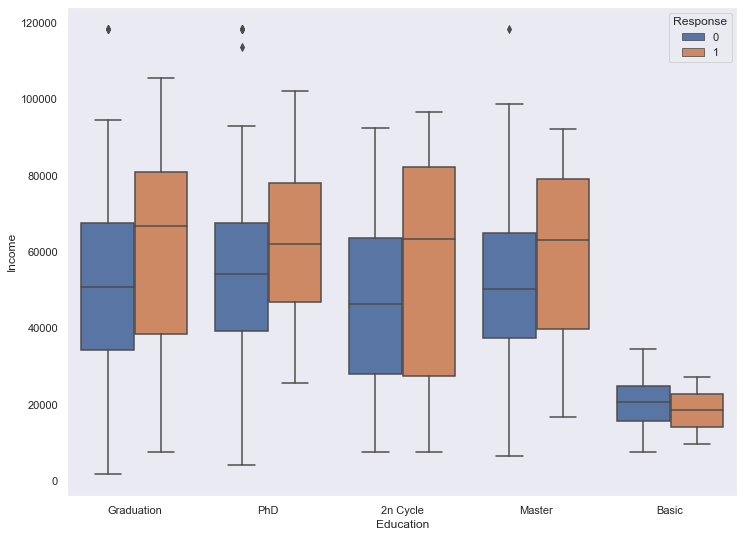

In [8]:
# Visualize a few of the outlier columns after outlier handling
sns.set_style('dark')
sns.boxplot(data=df_data, x='Education', y='Income', hue='Response')

<AxesSubplot:xlabel='Education', ylabel='NumCatalogPurchases'>

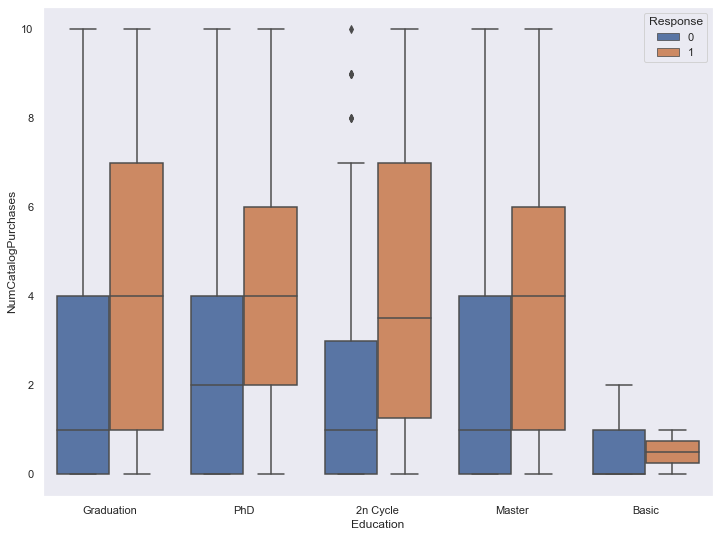

In [9]:
# Visualize a few of the outlier columns after outlier handling
sns.set_style('dark')
sns.boxplot(data=df_data, x='Education', y='NumCatalogPurchases', hue='Response')

- We can see that outliers outside of the inter-quartile range have been maxed or minned to the Interquartile range for a given category, post outlier treatment.
- There are other ways to treat for outliers but we will keep it simple in the interest of time.

### Distributions and visualizations w.r.t to the response variable

In [10]:
# Concatenate the response variable to the indpendent variables in the training set.
df_eda = eda.df_info(df_data)
ls_numerical_columns = list(df_eda[df_eda['data_type_grp'] == 'Numerical'].T.columns)
ls_categorical_columns = list(df_eda[df_eda['data_type_grp'] == 'Categorical'].T.columns)[1:]
ls_datetime_columns = list(df_eda[df_eda['data_type_grp'] == 'DateTime'].T.columns)

df_eda

,data_type,data_type_grp,num_unique_values,sample_unique_values,num_missing,perc_missing
ID,object,Categorical,2240,"[1826, 1, 10476, 1386, 5371, 7348, 4073, 1991,...",0,0.0000
Year_Birth,datetime64[ns],DateTime,59,"[1970, 1961, 1958, 1967, 1989, 1954, 1947, 197...",0,0.0000
Education,object,Categorical,5,"[Graduation, PhD, 2n Cycle, Master, Basic]",0,0.0000
Marital_Status,object,Categorical,8,"[Divorced, Single, Married, Together, Widow, Y...",0,0.0000
Income,float64,Numerical,1967,"[84835.0, 57091.0, 67267.0, 32474.0, 21474.0, ...",24,1.0714
Kidhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Teenhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Dt_Customer,datetime64[ns],DateTime,663,"[1402876800000000000, 1402790400000000000, 139...",0,0.0000
Recency,int64,Numerical,100,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]",0,0.0000
MntWines,int64,Numerical,776,"[189, 464, 134, 10, 6, 336, 769, 78, 384, 450]",0,0.0000


In [11]:
eda.numerical_describe(df_data[ls_numerical_columns])

,count,mean,std,0%,10%,20%,30%,40%,50%,60%,70%,80%,90%,95%,100%
Income,2216.0000,51874.4932,21059.7409,1730.0000,24117.5000,32011.0000,38198.5000,44529.0000,51381.5000,58482.0000,65247.5000,71819.0000,79844.0000,84130.0000,118350.5000
Kidhome,2240.0000,0.4442,0.5384,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,2.0000
Teenhome,2240.0000,0.5062,0.5445,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000,2.0000
Recency,2240.0000,49.1094,28.9625,0.0000,9.0000,19.0000,29.0000,39.0000,49.0000,59.0000,69.0000,79.0000,89.0000,94.0000,99.0000
MntWines,2240.0000,303.9357,336.5974,0.0000,6.0000,16.0000,34.0000,81.0000,173.5000,284.4000,418.6000,581.2000,822.1000,1000.0000,1493.0000
MntFruits,2240.0000,26.3022,39.7734,0.0000,0.0000,1.0000,2.0000,4.0000,8.0000,15.0000,25.0000,44.0000,83.0000,123.0000,199.0000
MntMeatProducts,2240.0000,166.9500,225.7154,0.0000,7.0000,12.0000,20.0000,35.0000,67.0000,108.4000,177.0000,298.4000,499.0000,687.1000,1725.0000
MntFishProducts,2240.0000,37.5254,54.6290,0.0000,0.0000,2.0000,3.0000,7.0000,12.0000,20.0000,37.0000,65.0000,120.0000,168.0500,259.0000
MntSweetProducts,2240.0000,27.0629,41.2805,0.0000,0.0000,1.0000,2.0000,5.0000,8.0000,14.0000,26.0000,44.2000,89.0000,126.0000,263.0000
MntGoldProds,2240.0000,44.0219,52.1674,0.0000,3.0000,6.0000,11.0000,17.0000,24.0000,34.0000,46.0000,73.0000,122.0000,165.0500,362.0000


**1. Plot for Income**

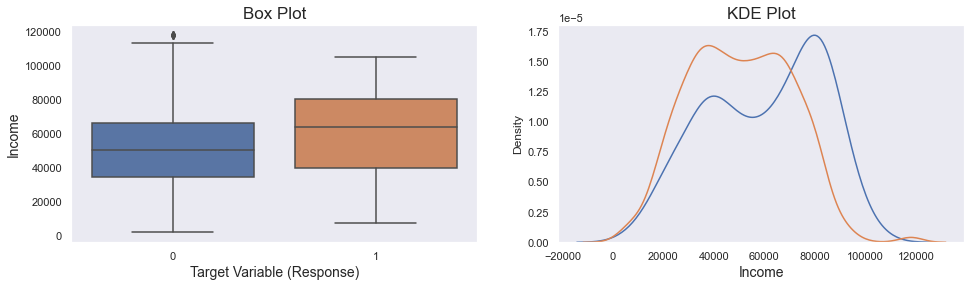

**2. Plot for Kidhome**

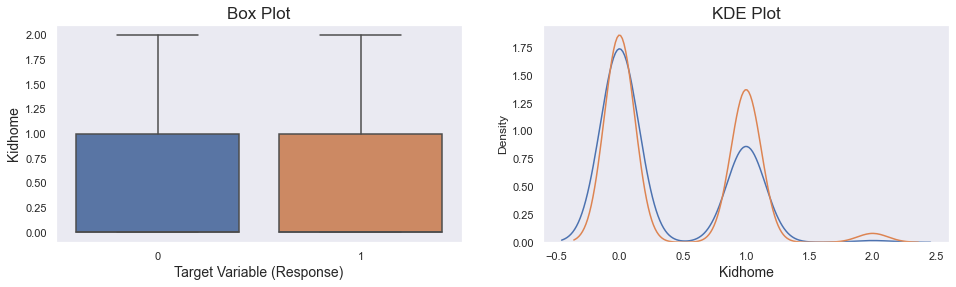

**3. Plot for Teenhome**

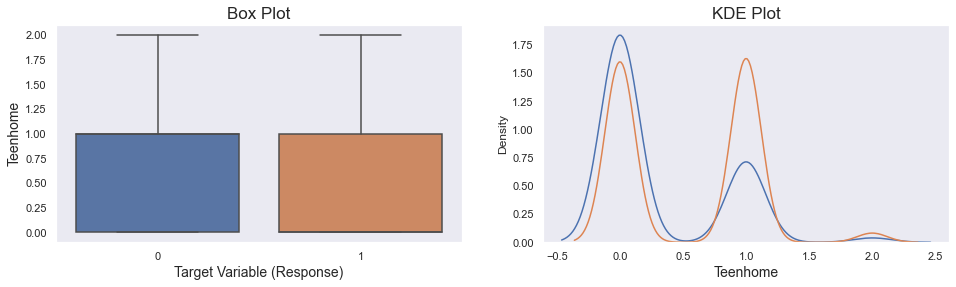

**4. Plot for Recency**

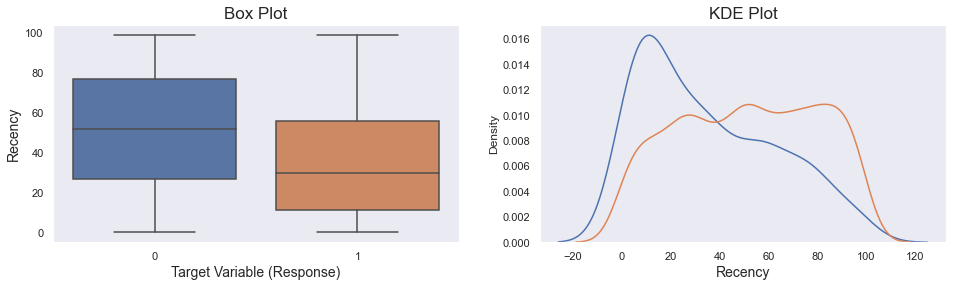

**5. Plot for MntWines**

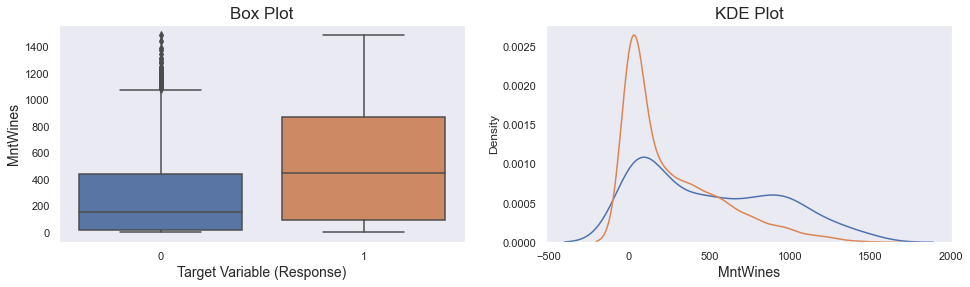

**6. Plot for MntFruits**

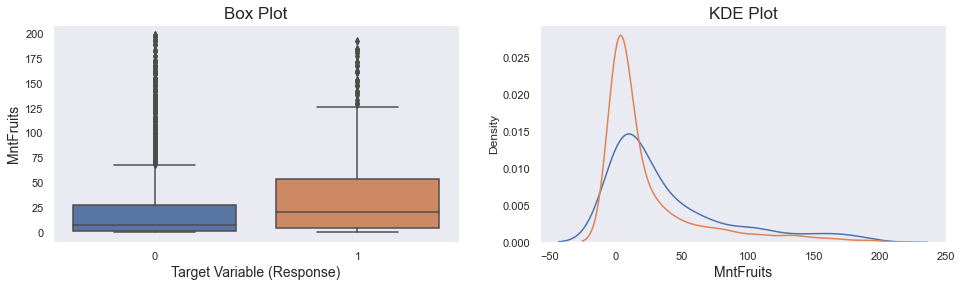

**7. Plot for MntMeatProducts**

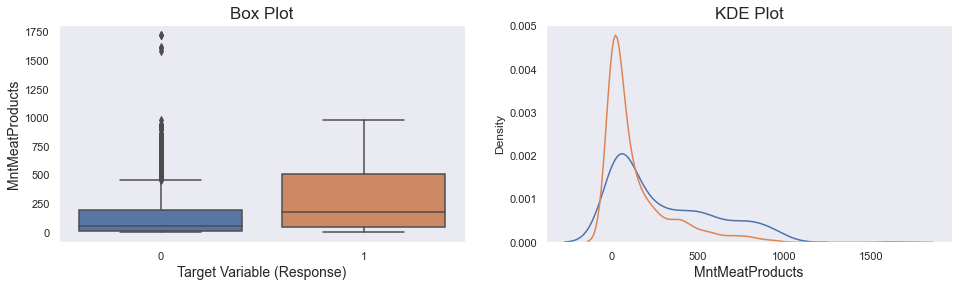

**8. Plot for MntFishProducts**

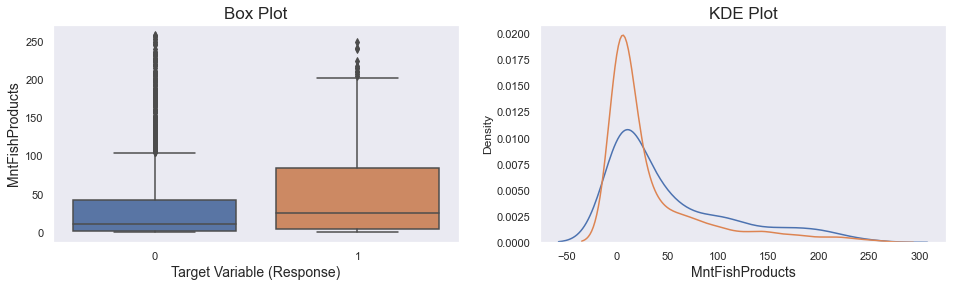

**9. Plot for MntSweetProducts**

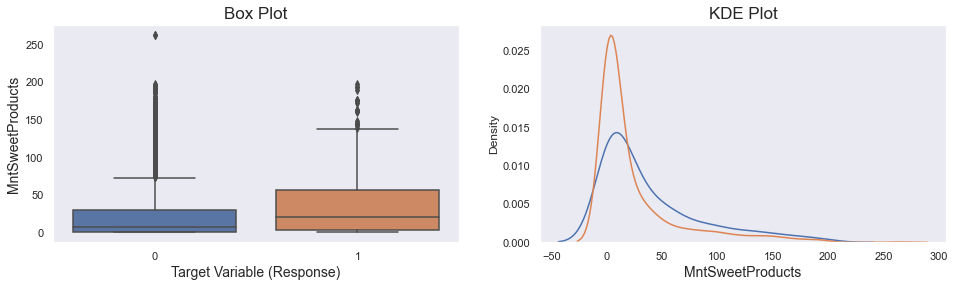

**10. Plot for MntGoldProds**

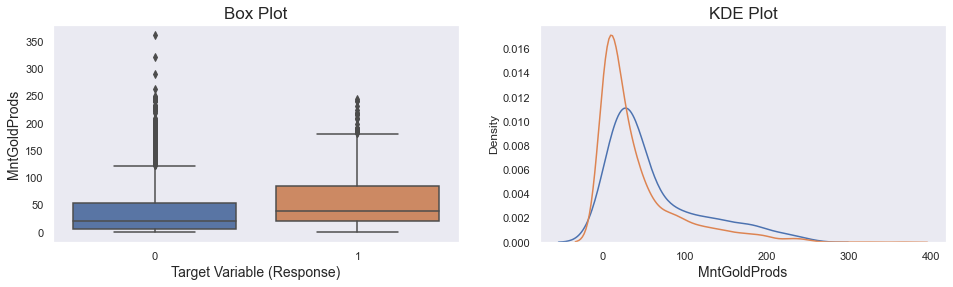

**11. Plot for NumDealsPurchases**

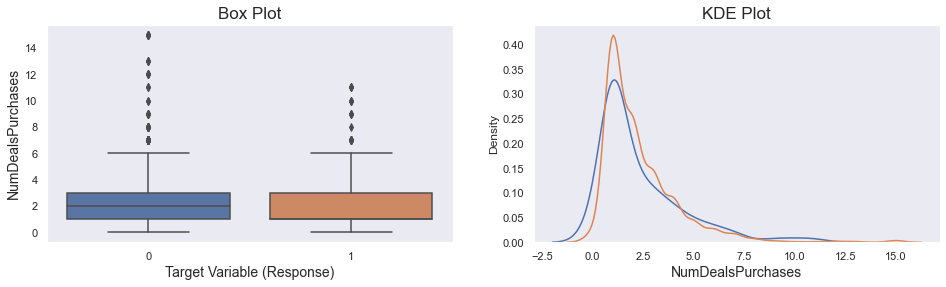

**12. Plot for NumWebPurchases**

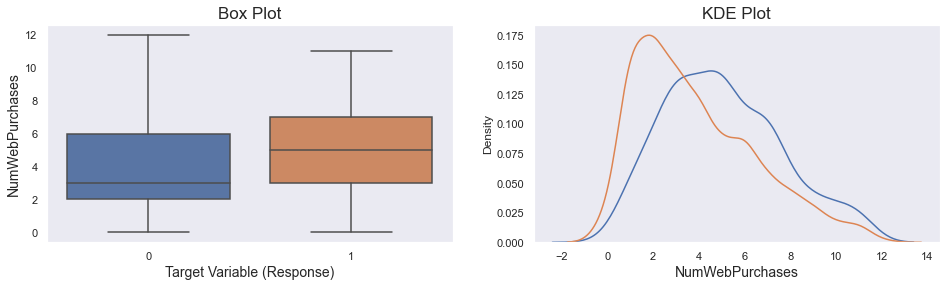

**13. Plot for NumCatalogPurchases**

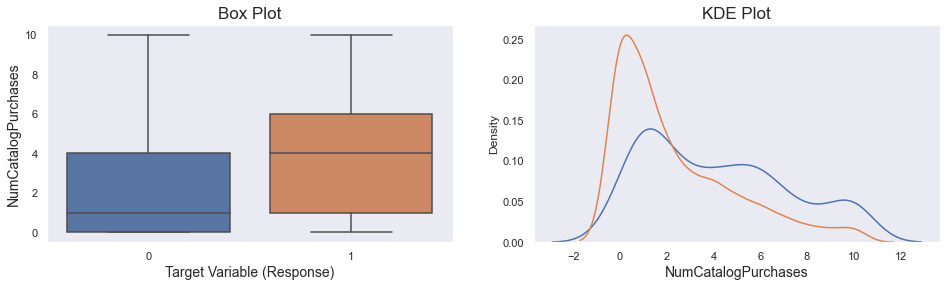

**14. Plot for NumStorePurchases**

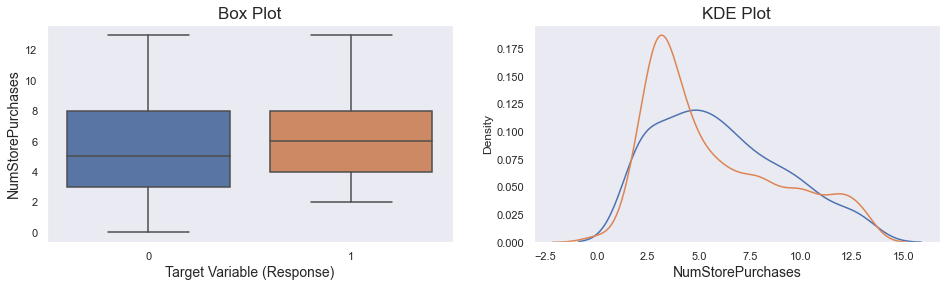

**15. Plot for NumWebVisitsMonth**

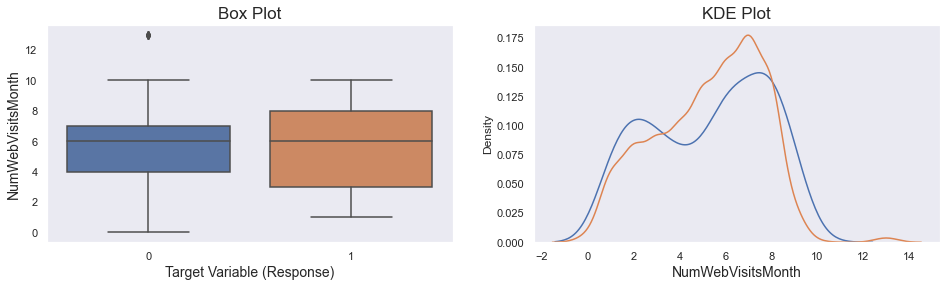

**16. Plot for AcceptedCmp3**

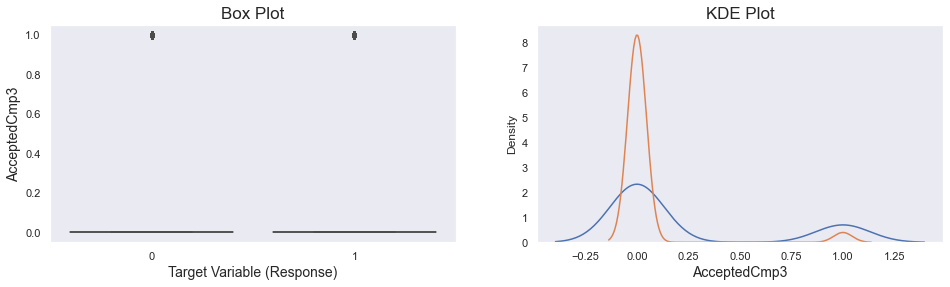

**17. Plot for AcceptedCmp4**

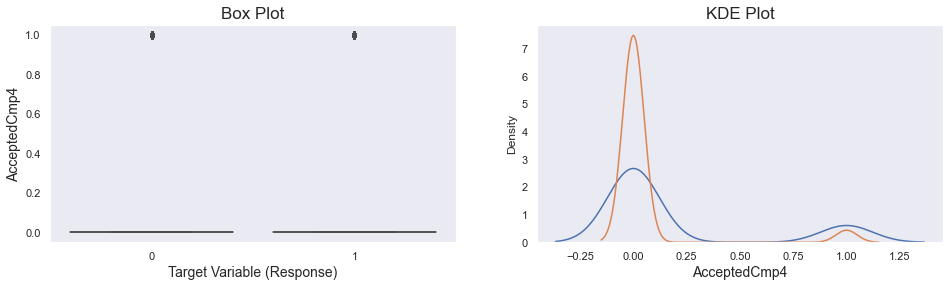

**18. Plot for AcceptedCmp5**

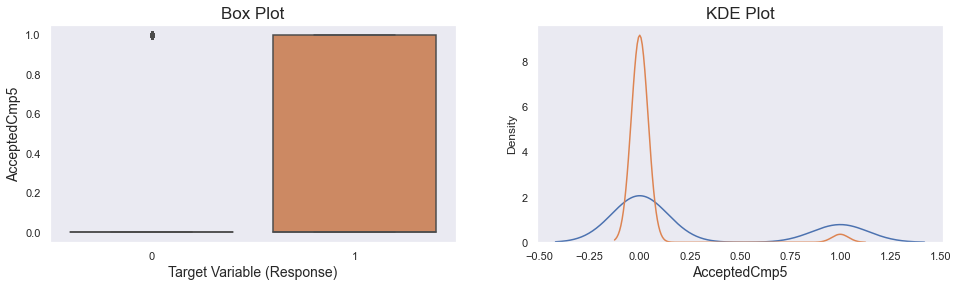

**19. Plot for AcceptedCmp1**

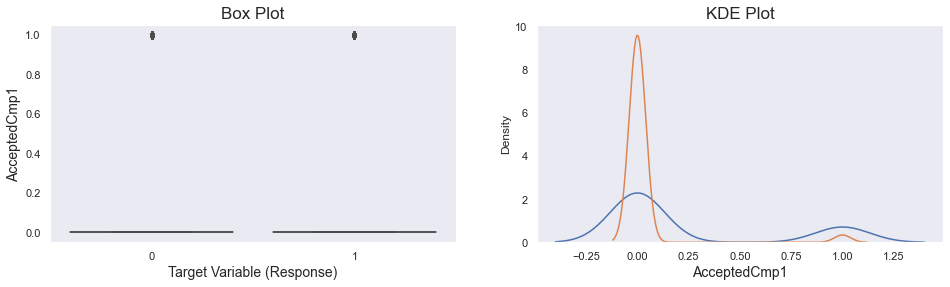

**20. Plot for AcceptedCmp2**

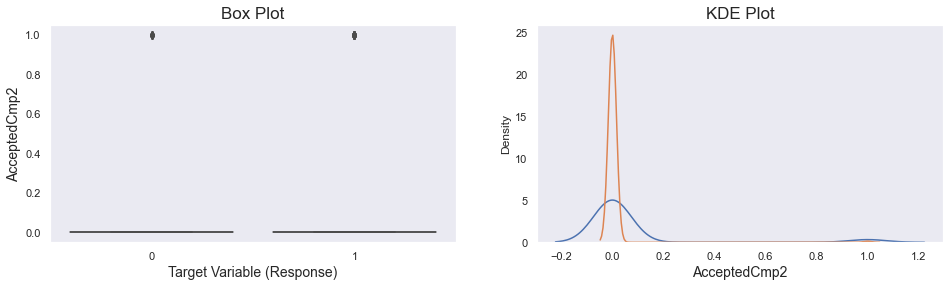

**21. Plot for Complain**

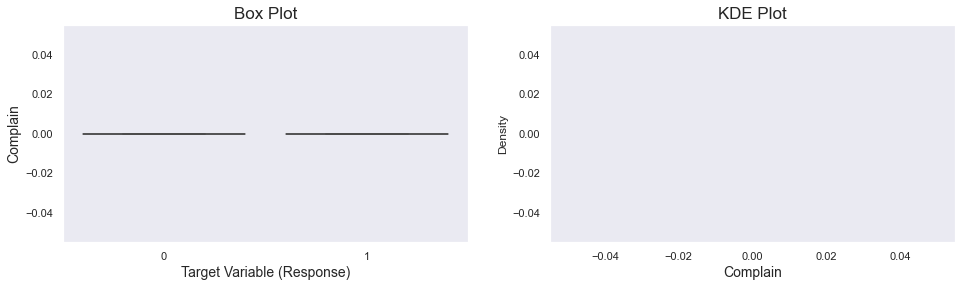

In [12]:
sns.set_style('dark')
eda.numerical_plots_with_target(df_data, variables=ls_numerical_columns, target='Response', model_type='clf')

**<u> 1. Plot for Education</u>**

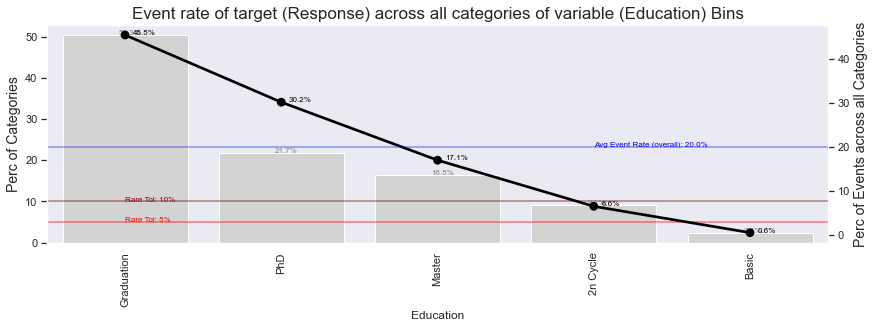

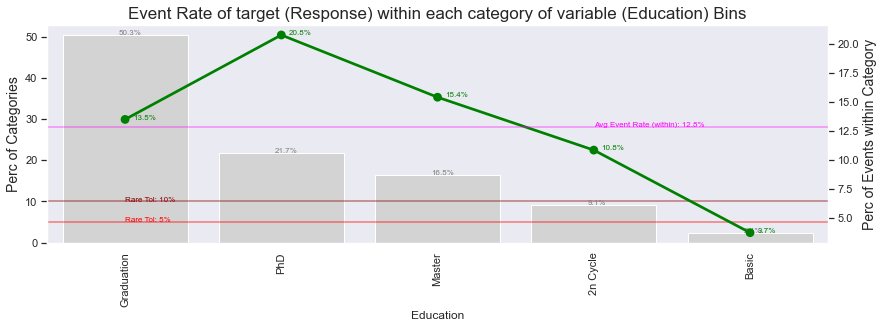

**<u> 2. Plot for Marital_Status</u>**

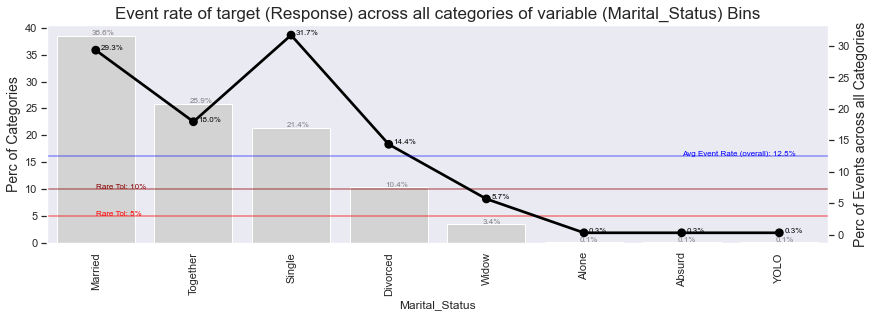

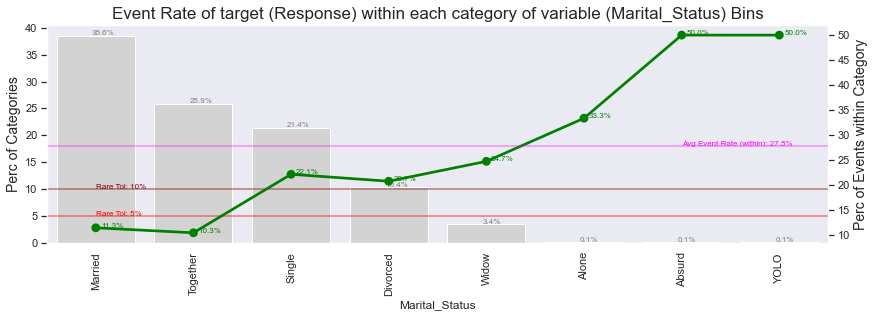

**<u> 3. Plot for Country</u>**

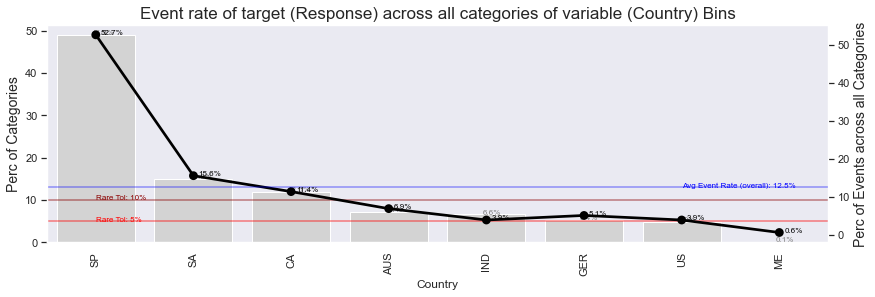

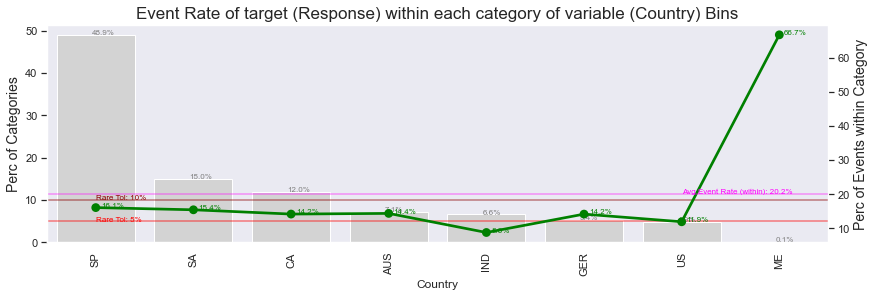

In [13]:
sns.set_style('dark')
eda.categorical_plots_with_target(df_data, variables=ls_categorical_columns, target='Response', model_type='clf')

Again we can ignore some of the variables that are derived from raw data. Plus the above EDA shows us that there is signal in the following numerical variables. The event rate in the categorical variables seems to indicate a little bit of bias from a country standpoint for e.g., however there is nothing out of the ordinary.

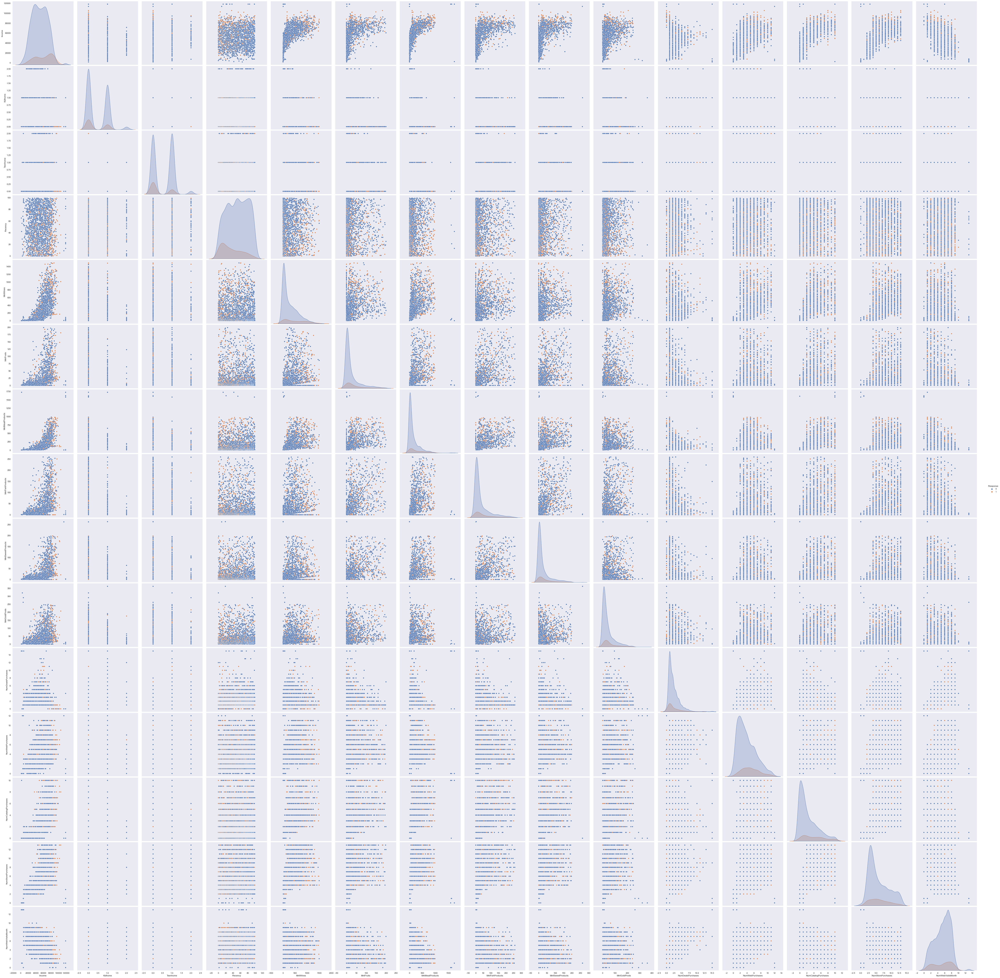

In [14]:
ls_numerical_columns_subset = ['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 
                               'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Response']
sns.set_style('dark')
# sns.pairplot(X_y_train[ls_numerical_columns_subset], hue='Response', size=5).set(xscale="log")
sns.pairplot(df_data[ls_numerical_columns_subset], hue='Response', size=5)

There is a lot happening in the above pairplot. However, let's try to simplify it.
- The key for us is the diagonal of the Pairplot. The diagonals plot the distribution of the variables in question split by our response/dependent variable.
- What we don't want to see is that distribution of the variable in question for the response variable is very close to each other or worse, exactly the same since. Why is that?

Let's take an example of two variables where we plot it's distribution against the response variable, as below:

Variable 1: Income

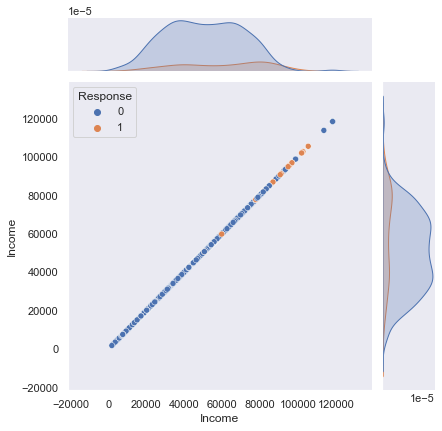

In [15]:
sns.set_style('dark')
sns.jointplot(data=df_data, x='Income', y='Income', hue='Response')

<AxesSubplot:xlabel='Income', ylabel='Count'>

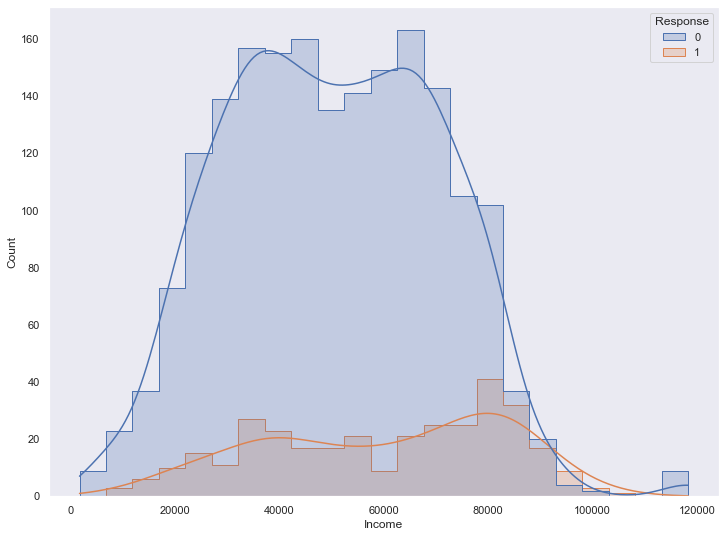

In [16]:
sns.set_style('dark')
sns.histplot(data=df_data, x='Income', hue='Response', element="step", kde=True)

Variable 2: Recency

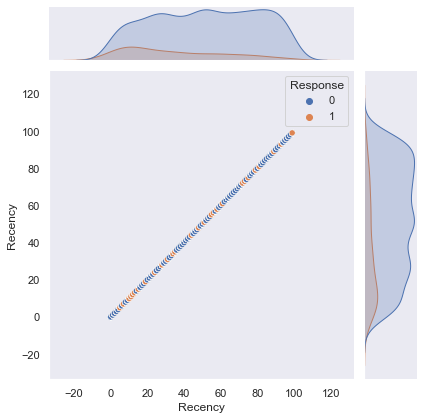

In [17]:
sns.set_style('dark')
sns.jointplot(data=df_data, x='Recency', y='Recency', hue='Response')

<AxesSubplot:xlabel='Recency', ylabel='Count'>

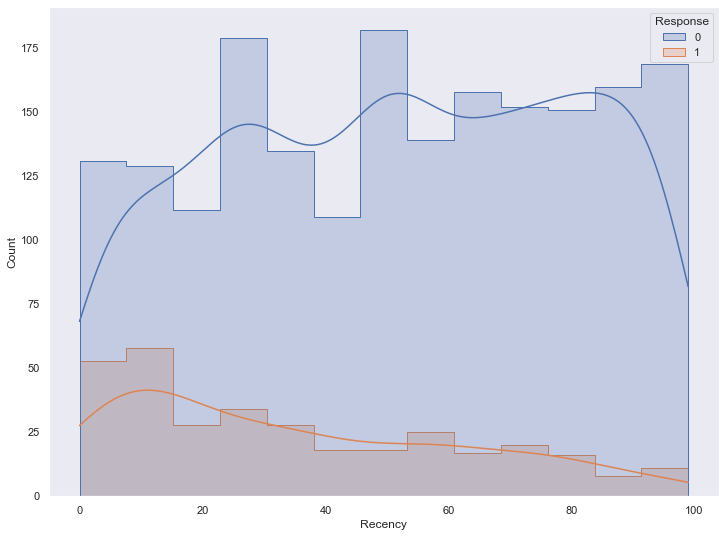

In [18]:
sns.set_style('dark')
sns.histplot(data=df_data, x='Recency', hue='Response', element="step", kde=True)

The histograms of the two variables plotted against our response variables makes it clear that these distributions are different. **Why is this important?** If we recally simple hypothesis testing, the difference in means of the distributions would indicate there is some signal in the system to reject the null hypothesis. 

The difference in distributions for the subset of variables we've considered in the pair plot w.r.t to the response/dependent variable (the diagonals) seems to signal there is some signal for response/dependent variable. 

Whether it is significant or not, we can understand by further modeling and transforming the data later. 

Given the above EDA, we can subset the columns/variables for our analysis in the main dataset to as shown below

In [19]:
ls_cols_subset = ls_datetime_columns + ls_categorical_columns + ls_numerical_columns_subset
df_data = df_data[ls_cols_subset]
df_data.head()

,Year_Birth,Dt_Customer,Education,Marital_Status,Country,Income,Kidhome,Teenhome,Recency,MntWines,...,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response
0,1970-01-01 00:00:00.000001970,2014-06-16,Graduation,Divorced,SP,84835.0000,0,0,0,189,...,379,111,189,218,1,4.0000,4.0000,6,1.0000,1
1,1970-01-01 00:00:00.000001961,2014-06-15,Graduation,Single,CA,57091.0000,0,0,0,464,...,64,7,0,37,1,7.0000,3.0000,7,5.0000,1
2,1970-01-01 00:00:00.000001958,2014-05-13,Graduation,Married,US,67267.0000,0,1,0,134,...,59,15,2,30,1,3.0000,2.0000,5,2.0000,0
3,1970-01-01 00:00:00.000001967,2014-05-11,Graduation,Together,AUS,32474.0000,1,1,0,10,...,1,0,0,0,1,1.0000,0.0000,2,7.0000,0
4,1970-01-01 00:00:00.000001989,2014-04-08,Graduation,Single,SP,21474.0000,1,0,0,6,...,24,11,0,34,2,3.0000,1.0000,2,7.0000,1


### Variance Inflation and Multicollinearity

Another important aspect to consider is multicollinearity. We want our independent variables that are correlated to the dependent variable to explain it, however, we don't correlation of the independent variables amongst themselves. **Why is this important?** If we have two independent variables that explain the dependent/response variable, and the variance between them is very similiar ,why not just use one of them that explains the dependent variable better.

We can find this by plotting a correlation matrix and visualize it using a heatmap. Assuming a correlation threshold of 0.5

In [20]:
d_corr_threshold = 0.5
df_data_corr = df_data.corr()
eda.numerical_describe(df_data_corr)

,count,mean,std,0%,10%,20%,30%,40%,50%,60%,70%,80%,90%,95%,100%
Income,16.0000,0.3234,0.4657,-0.6579,-0.3195,0.0054,0.1013,0.4016,0.5088,0.5346,0.5953,0.6921,0.7133,0.7898,1.0000
Kidhome,16.0000,-0.1729,0.4264,-0.5308,-0.5114,-0.4963,-0.4124,-0.3768,-0.3716,-0.3496,-0.0581,0.0088,0.3429,0.5980,1.0000
Teenhome,16.0000,0.0418,0.3030,-0.2612,-0.1905,-0.1625,-0.1324,-0.0361,-0.0084,0.0162,0.0434,0.1393,0.2743,0.5408,1.0000
Recency,16.0000,0.0569,0.2570,-0.1984,-0.0138,-0.0042,-0.0001,0.0011,0.0071,0.0161,0.0164,0.0227,0.0266,0.2726,1.0000
MntWines,16.0000,0.3246,0.3974,-0.4963,-0.1604,0.0109,0.1317,0.3866,0.3886,0.3998,0.5697,0.6421,0.6960,0.7801,1.0000
MntFruits,16.0000,0.2702,0.3963,-0.4283,-0.2747,-0.1321,0.0605,0.3169,0.3913,0.4618,0.5228,0.5431,0.5810,0.6961,1.0000
MntMeatProducts,16.0000,0.2886,0.4419,-0.5525,-0.3491,-0.1224,0.1297,0.3146,0.4151,0.5238,0.5529,0.5684,0.6946,0.7729,1.0000
MntFishProducts,16.0000,0.2735,0.4095,-0.4561,-0.2959,-0.1394,0.0562,0.3141,0.4113,0.4599,0.5515,0.5762,0.5873,0.6961,1.0000
MntSweetProducts,16.0000,0.2710,0.3924,-0.4331,-0.2666,-0.1201,0.0700,0.3393,0.3782,0.4488,0.5266,0.5380,0.5735,0.6849,1.0000
MntGoldProds,16.0000,0.2604,0.3233,-0.3496,-0.1396,0.0167,0.0945,0.3506,0.3757,0.3875,0.3973,0.4089,0.4480,0.6049,1.0000


<AxesSubplot:>

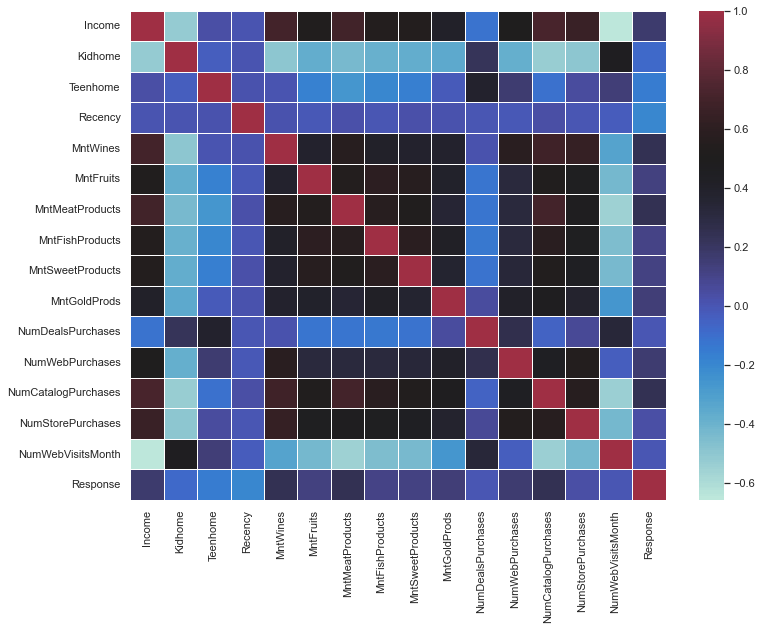

In [21]:
sns.set_style('dark')
# sns.heatmap(df_data_corr, center=eda.numerical_describe(df_data_corr)['50%'].mean(), linewidths=.5)
sns.heatmap(df_data_corr, center=d_corr_threshold, linewidths=.5)

In [22]:
print('Number of Columns: {}'.format(len(df_data_corr.columns)))
df_data_corr.columns

Number of Columns: 16


Index(['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Response'],
      dtype='object')

The heatmap gives us good insights here. It shows us the variables 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases' are pretty correlated to one another. Let's see how they are correlated to the response variable, though.

In [23]:
df_data_corr_unstack = df_data_corr[['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 
                                     'MntSweetProducts', 'MntGoldProds', 'NumWebPurchases', 
                                     'NumCatalogPurchases', 'NumStorePurchases', 'Response']].unstack()
df_data_corr_sort = df_data_corr_unstack.sort_values(kind="quicksort").to_frame()
df_data_corr_sort.columns = ['correlation']
df_data_corr_sort_vars = df_data_corr_sort[(df_data_corr_sort['correlation']>d_corr_threshold) & (df_data_corr_sort['correlation']<1)]
df_data_corr_sort_vars = df_data_corr_sort_vars.reset_index().sort_values(kind="quicksort", by='level_0').drop_duplicates(subset='correlation').reset_index(drop=True)
df_data_corr_sort_vars.columns = ['var_1','var_2','var_correlation']

df_data_corr_sort_response = df_data_corr_sort.reset_index()
df_data_corr_sort_response = df_data_corr_sort_response[df_data_corr_sort_response['level_0'] == 'Response']
df_data_corr_sort_response = df_data_corr_sort_response.sort_values(kind="quicksort", by='level_1').drop_duplicates(subset='correlation').reset_index(drop=True)
df_data_corr_sort_response.columns = ['response','response_var','response_var_correlation']

df_merge = pd.merge(left=df_data_corr_sort_vars, right=df_data_corr_sort_response, how='inner', left_on=['var_1'], right_on=['response_var'])
df_merge = df_merge.rename(columns={'response_var_correlation':'response_var_1_correlation'})
df_merge = pd.merge(left=df_merge, right=df_data_corr_sort_response, how='inner', left_on=['var_2'], right_on=['response_var'])
df_merge = df_merge.rename(columns={'response_var_correlation':'response_var_2_correlation'})
df_merge = df_merge.drop(columns=['response_x','response_var_x','response_y','response_var_y'])

# Keep the variable that has higher correlation / covariance with the response variable
df_merge['vars_to_keep'] = df_merge.apply(lambda x: x['var_1'] if x['response_var_1_correlation'] > x['response_var_2_correlation'] else x['var_2'], axis=1)
df_merge

,var_1,var_2,var_correlation,response_var_1_correlation,response_var_2_correlation,vars_to_keep
0,MntFishProducts,MntFruits,0.5948,0.1113,0.1253,MntFruits
1,MntFishProducts,MntSweetProducts,0.5799,0.1113,0.1174,MntSweetProducts
2,MntFruits,MntSweetProducts,0.5672,0.1253,0.1174,MntFruits
3,MntMeatProducts,MntSweetProducts,0.5238,0.2363,0.1174,MntMeatProducts
4,MntFishProducts,NumCatalogPurchases,0.5762,0.1113,0.2377,NumCatalogPurchases
5,MntFruits,NumCatalogPurchases,0.5234,0.1253,0.2377,NumCatalogPurchases
6,MntMeatProducts,NumCatalogPurchases,0.6972,0.2363,0.2377,NumCatalogPurchases
7,MntSweetProducts,NumCatalogPurchases,0.5293,0.1174,0.2377,NumCatalogPurchases
8,MntWines,NumCatalogPurchases,0.6852,0.2473,0.2377,MntWines
9,MntFishProducts,MntMeatProducts,0.5684,0.1113,0.2363,MntMeatProducts


Given the above we can further subset and finalize the columns to be used in our analysis. We keep the variables from our correlation matrix that had minimum correlation with each other i.e. below the assumed correlation threshold and the variables from the heatmap analysis that had higher correlation to the response variable.

In [24]:
print('Number of Columns: {}'.format(len(df_merge['vars_to_keep'].unique())))
df_merge['vars_to_keep'].unique()

Number of Columns: 7


array(['MntFruits', 'MntSweetProducts', 'MntMeatProducts',
       'NumCatalogPurchases', 'MntWines', 'Income', 'NumWebPurchases'],
      dtype=object)

In [25]:
ls_cols_subset = ls_datetime_columns + ls_categorical_columns + ['Kidhome', 'Teenhome', 'Recency', 'NumWebVisitsMonth'] + list(df_merge['vars_to_keep'].unique()) + ['Response']
df_data = df_data[ls_cols_subset]
print('Shape of the data: {}'.format(df_data.shape))
df_data.head()

Shape of the data: (2240, 17)


,Year_Birth,Dt_Customer,Education,Marital_Status,Country,Kidhome,Teenhome,Recency,NumWebVisitsMonth,MntFruits,MntSweetProducts,MntMeatProducts,NumCatalogPurchases,MntWines,Income,NumWebPurchases,Response
0,1970-01-01 00:00:00.000001970,2014-06-16,Graduation,Divorced,SP,0,0,0,1.0000,104,189,379,4.0000,189,84835.0000,4.0000,1
1,1970-01-01 00:00:00.000001961,2014-06-15,Graduation,Single,CA,0,0,0,5.0000,5,0,64,3.0000,464,57091.0000,7.0000,1
2,1970-01-01 00:00:00.000001958,2014-05-13,Graduation,Married,US,0,1,0,2.0000,11,2,59,2.0000,134,67267.0000,3.0000,0
3,1970-01-01 00:00:00.000001967,2014-05-11,Graduation,Together,AUS,1,1,0,7.0000,0,0,1,0.0000,10,32474.0000,1.0000,0
4,1970-01-01 00:00:00.000001989,2014-04-08,Graduation,Single,SP,1,0,0,7.0000,16,0,24,1.0000,6,21474.0000,3.0000,1


Sanity check the dependent variable and independent variable collection. 
- Is it practical? For e.g. we are not using any features that are dependent on the future. 
- Can we explain it to the business in simple terms?

## Model Building:

### Split the data into Training, Validation and Test sets
- 80:20 split between training and testing data
- Split the data before doing any sort of pre-processing into test, valid and training data for a given response variable
    - Train:Valid:Test = 80%:1%:19%
    - This is just so we will never use the Valid data and just use the Test data for predicting / evaluating the model

In [26]:
X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(df_data, target = 'Response', train_size=0.8, valid_size=0.001, test_size=0.199)

# Get the shape of all the datasets
print('Shape of X_train: {}'.format(X_train.shape))
print('Shape of Y_train: {}'.format(y_train.shape))
print('Shape of X_valid: {}'.format(X_valid.shape))
print('Shape of Y_valid: {}'.format(y_valid.shape))
print('Shape of X_test: {}'.format(X_test.shape))
print('Shape of Y_test: {}'.format(y_test.shape))

Shape of X_train: (1792, 16)
Shape of Y_train: (1792,)
Shape of X_valid: (2, 16)
Shape of Y_valid: (2,)
Shape of X_test: (446, 16)
Shape of Y_test: (446,)


In [27]:
X_train.head()

,Year_Birth,Dt_Customer,Education,Marital_Status,Country,Kidhome,Teenhome,Recency,NumWebVisitsMonth,MntFruits,MntSweetProducts,MntMeatProducts,NumCatalogPurchases,MntWines,Income,NumWebPurchases
1700,1970-01-01 00:00:00.000001980,2013-06-16,Graduation,Single,SP,0,0,75,2.0000,153,134,940,6.0000,249,81741.0000,6.0000
1085,1970-01-01 00:00:00.000001988,2013-01-13,Graduation,Married,CA,0,0,48,4.0000,12,89,385,7.0000,758,68487.0000,9.0000
1748,1970-01-01 00:00:00.000001958,2012-12-11,Graduation,Together,IND,1,1,77,7.0000,8,0,17,2.0000,53,28087.0000,2.0000
1848,1970-01-01 00:00:00.000001986,2014-05-18,Graduation,Together,SA,1,0,82,5.0000,99,149,431,4.0000,812,83033.0000,11.0000
734,1970-01-01 00:00:00.000001981,2012-12-21,PhD,Together,GER,0,0,31,6.0000,17,8,133,3.0000,728,44953.0000,7.0000


In [28]:
y_train.unique()

array([0, 1])

### Gather the Numerical and Categorical variable names

In [29]:
# Garner the numerical and categorical variables seperately
df_eda_X = eda.df_info(X_train)
ls_numerical_columns_X = list(df_eda_X[df_eda_X['data_type_grp'] == 'Numerical'].T.columns)
ls_categorical_columns_X = list(df_eda_X[df_eda_X['data_type_grp'] == 'Categorical'].T.columns)
ls_datetime_columns_X = list(df_eda_X[df_eda_X['data_type_grp'] == 'DateTime'].T.columns)

df_eda_X

,data_type,data_type_grp,num_unique_values,sample_unique_values,num_missing,perc_missing
Year_Birth,datetime64[ns],DateTime,59,"[1980, 1988, 1958, 1986, 1981, 1978, 1961, 195...",0,0.0000
Dt_Customer,datetime64[ns],DateTime,629,"[1371340800000000000, 1358035200000000000, 135...",0,0.0000
Education,object,Categorical,5,"[Graduation, PhD, 2n Cycle, Master, Basic]",0,0.0000
Marital_Status,object,Categorical,8,"[Single, Married, Together, Widow, Absurd, Div...",0,0.0000
Country,object,Categorical,8,"[SP, CA, IND, SA, GER, AUS, US, ME]",0,0.0000
Kidhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Teenhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Recency,int64,Numerical,100,"[75, 48, 77, 82, 31, 34, 10, 81, 60, 25]",0,0.0000
NumWebVisitsMonth,float64,Numerical,12,"[2.0, 4.0, 7.0, 5.0, 6.0, 3.0, 8.0, 1.0, 9.0, ...",0,0.0000
MntFruits,int64,Numerical,154,"[153, 12, 8, 99, 17, 0, 7, 36, 55, 80]",0,0.0000


In [30]:
print('Numerical Columns: {}'.format(ls_numerical_columns_X))
print('Categorical Columns: {}'.format(ls_categorical_columns_X))
print('Datetime Columns: {}'.format(ls_datetime_columns_X))

Numerical Columns: ['Kidhome', 'Teenhome', 'Recency', 'NumWebVisitsMonth', 'MntFruits', 'MntSweetProducts', 'MntMeatProducts', 'NumCatalogPurchases', 'MntWines', 'Income', 'NumWebPurchases']
Categorical Columns: ['Education', 'Marital_Status', 'Country']
Datetime Columns: ['Year_Birth', 'Dt_Customer']


### Missing data handling and imputation
- We see ~ 1% of the data having missing values for the income field. Income as a variable, when you think of it, is most likely to be correlated quite a bit to the customer demographic. So assuming a blanket mean income from the overall data is likely to bias the data. So for this case, it would be okay to just we will just drop those rows from the data set.
- In a general sense, we'd like to impute the numerical and categorical data.
- For the purpose of a baseline model, we will leverage the generalized method to get to the model in the interest of time.
- When in doubt, leverage common sense for each variable or if you've a large enough sample of data, drop the rows that have missing data.

In [31]:
# Drop the rows with missing data for the Income column. 
# df_data.dropna(subset=['Income'], inplace=True)

num_imputer = MissingDataImputer_Numerical(method = 'median', add_indicator=False)

#Scikit-learn type fit() transform() functionality
# Use fit() only on the train dataset
num_imputer.fit(X_train, variables = ls_numerical_columns_X)
print('Parameters for the Imputer to fit for different numerical variables: {}'.format(num_imputer.param_dict_))

# Use transform() on train/test dataset
X_train = num_imputer.transform(X_train)
X_test = num_imputer.transform(X_test)

Parameters for the Imputer to fit for different numerical variables: {'Kidhome': 0.0, 'Teenhome': 0.0, 'Recency': 49.0, 'NumWebVisitsMonth': 6.0, 'MntFruits': 8.0, 'MntSweetProducts': 8.0, 'MntMeatProducts': 65.0, 'NumCatalogPurchases': 2.0, 'MntWines': 172.0, 'Income': 51287.0, 'NumWebPurchases': 4.0}


In [32]:
cat_imputer = MissingDataImputer_Categorical(method = 'frequent', add_indicator=False)

#Scikit-learn type fit() transform() functionality
# Use fit() only on the train dataset
cat_imputer.fit(X_train, ls_categorical_columns_X)
print('Parameters for the Imputer to fit for different categorical variables: {}'.format(cat_imputer.param_dict_))

# Use transform() on train/test dataset
X_train = cat_imputer.transform(X_train)
X_test = cat_imputer.transform(X_test)

Parameters for the Imputer to fit for different categorical variables: {'Education': 'Graduation', 'Marital_Status': 'Married', 'Country': 'SP'}


In [33]:
eda.df_info(X_train)

,data_type,data_type_grp,num_unique_values,sample_unique_values,num_missing,perc_missing
Year_Birth,datetime64[ns],DateTime,59,"[1980, 1988, 1958, 1986, 1981, 1978, 1961, 195...",0,0.0000
Dt_Customer,datetime64[ns],DateTime,629,"[1371340800000000000, 1358035200000000000, 135...",0,0.0000
Education,object,Categorical,5,"[Graduation, PhD, 2n Cycle, Master, Basic]",0,0.0000
Marital_Status,object,Categorical,8,"[Single, Married, Together, Widow, Absurd, Div...",0,0.0000
Country,object,Categorical,8,"[SP, CA, IND, SA, GER, AUS, US, ME]",0,0.0000
Kidhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Teenhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Recency,int64,Numerical,100,"[75, 48, 77, 82, 31, 34, 10, 81, 60, 25]",0,0.0000
NumWebVisitsMonth,float64,Numerical,12,"[2.0, 4.0, 7.0, 5.0, 6.0, 3.0, 8.0, 1.0, 9.0, ...",0,0.0000
MntFruits,int64,Numerical,154,"[153, 12, 8, 99, 17, 0, 7, 36, 55, 80]",0,0.0000


### Feature Engineering - Dates

In [34]:
dt_encoder = FeatureEngineering_DateTime(drop_orig=True)

#Scikit-learn type fit() transform() functionality
# Use fit() only on the train dataset
dt_encoder.fit(X_train, ls_datetime_columns_X, prefix = 'default')

# Use transform() on train/test dataset
X_train = dt_encoder.transform(X_train)
X_train.drop(labels=['Year_Birth:day_part','Dt_Customer:day_part'], axis=1, inplace=True)
X_test = dt_encoder.transform(X_test)
X_test.drop(labels=['Year_Birth:day_part','Dt_Customer:day_part'], axis=1, inplace=True)

In [35]:
eda.df_info(X_train)

,data_type,data_type_grp,num_unique_values,sample_unique_values,num_missing,perc_missing
Education,object,Categorical,5,"[Graduation, PhD, 2n Cycle, Master, Basic]",0,0.0000
Marital_Status,object,Categorical,8,"[Single, Married, Together, Widow, Absurd, Div...",0,0.0000
Country,object,Categorical,8,"[SP, CA, IND, SA, GER, AUS, US, ME]",0,0.0000
Kidhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Teenhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Recency,int64,Numerical,100,"[75, 48, 77, 82, 31, 34, 10, 81, 60, 25]",0,0.0000
NumWebVisitsMonth,float64,Numerical,12,"[2.0, 4.0, 7.0, 5.0, 6.0, 3.0, 8.0, 1.0, 9.0, ...",0,0.0000
MntFruits,int64,Numerical,154,"[153, 12, 8, 99, 17, 0, 7, 36, 55, 80]",0,0.0000
MntSweetProducts,int64,Numerical,171,"[134, 89, 0, 149, 8, 1, 6, 93, 45, 15]",0,0.0000
MntMeatProducts,int64,Numerical,494,"[940, 385, 17, 431, 133, 8, 9, 3, 168, 278]",0,0.0000


### Feature Engineering - Categorical Variables

In [36]:
df_eda_X = eda.df_info(X_train)
ls_numerical_columns_X = list(df_eda_X[df_eda_X['data_type_grp'] == 'Numerical'].T.columns)
ls_categorical_columns_X = list(df_eda_X[df_eda_X['data_type_grp'] == 'Categorical'].T.columns)
ls_datetime_columns_X = list(df_eda_X[df_eda_X['data_type_grp'] == 'DateTime'].T.columns)

cat_encoder = FeatureEngineering_Categorical(method = 'label')

#Scikit-learn type fit() transform() functionality
# Use fit() only on the train dataset
cat_encoder.fit(X_train, ls_categorical_columns_X, rare_tol=5)

# Use transform() on train/test dataset
X_train = cat_encoder.transform(X_train)
X_test = cat_encoder.transform(X_test)

In [37]:
eda.df_info(X_train)

,data_type,data_type_grp,num_unique_values,sample_unique_values,num_missing,perc_missing
Education,int64,Numerical,5,"[0, 1, 2, 3, 4]",0,0.0000
Marital_Status,int64,Numerical,8,"[0, 1, 2, 3, 4, 5, 6, 7]",0,0.0000
Country,int64,Numerical,8,"[0, 1, 2, 3, 4, 5, 6, 7]",0,0.0000
Kidhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Teenhome,int64,Numerical,3,"[0, 1, 2]",0,0.0000
Recency,int64,Numerical,100,"[75, 48, 77, 82, 31, 34, 10, 81, 60, 25]",0,0.0000
NumWebVisitsMonth,float64,Numerical,12,"[2.0, 4.0, 7.0, 5.0, 6.0, 3.0, 8.0, 1.0, 9.0, ...",0,0.0000
MntFruits,int64,Numerical,154,"[153, 12, 8, 99, 17, 0, 7, 36, 55, 80]",0,0.0000
MntSweetProducts,int64,Numerical,171,"[134, 89, 0, 149, 8, 1, 6, 93, 45, 15]",0,0.0000
MntMeatProducts,int64,Numerical,494,"[940, 385, 17, 431, 133, 8, 9, 3, 168, 278]",0,0.0000


### Feature Engineering - Numeric Variables: Data mapping to normal distribution and/or normalization and/or standardization

- If the numeric data is distributed normally, then it may help to standardize the variable to zero mean and unit variance.
- An alternative to standardization is Scaling features to a range
- Depending on the variable distribution, it may help to transform the variable into Gaussian distribution using a Power transformer
In our case, since we will be using a decision tree to model the response data and since decison trees are robust to scaling and outliers, so we will **ignore normalization/scaling** of Numeric variables.

In [38]:
pt = preprocessing.PowerTransformer(method='yeo-johnson', standardize=False)
pt.fit_transform(X_train[ls_numerical_columns_X])


# # Use transform() on train/test dataset
# train = num_binner.transform(train)
# test = num_binner.transform(test)
pd.concat([pd.DataFrame(columns=X_train[ls_numerical_columns_X].columns, data=pt.fit_transform(X_train[ls_numerical_columns_X])), pd.DataFrame(columns=['Response'], data=y_train).reset_index(drop=True)], axis=1)
# pd.DataFrame(columns=X_train[ls_numerical_columns_X].columns, data=pt.fit_transform(X_train[ls_numerical_columns_X]))
# pd.DataFrame(columns=['Response'], data=y_train).reset_index(drop=True)

# sns.pairplot(pd.concat([pd.DataFrame(columns=X_train[ls_numerical_columns_X].columns, data=pt.fit_transform(X_train[ls_numerical_columns_X])), pd.DataFrame(columns=['Response'], data=y_train).reset_index(drop=True)], axis=1), hue='Response', size=5)

,Kidhome,Teenhome,Recency,NumWebVisitsMonth,MntFruits,MntSweetProducts,MntMeatProducts,NumCatalogPurchases,MntWines,Income,...,Dt_Customer:month,Dt_Customer:day,Dt_Customer:day_of_week,Dt_Customer:day_of_year,Dt_Customer:weekofyear,Dt_Customer:hour,Dt_Customer:minute,Dt_Customer:second,Dt_Customer:is_weekend,Response
0,-0.0000,-0.0000,28.9372,2.1597,4.6050,4.4592,7.5807,1.7917,9.8044,8381.9350,...,4.1073,8.8720,4.1815,46.8628,12.0103,0.0000,0.0000,0.0000,0.2211,0
1,-0.0000,-0.0000,20.8267,4.5110,2.4496,4.1225,6.5061,1.9040,13.3625,7306.2130,...,0.8893,7.5702,4.1815,7.4053,1.6476,0.0000,0.0000,0.0000,0.2211,0
2,0.4371,0.5731,29.5009,8.2457,2.1122,-0.0000,3.0161,1.0483,5.9848,3656.9851,...,7.0741,6.6547,0.8943,77.8050,20.6203,0.0000,0.0000,0.0000,-0.0000,0
3,0.4371,-0.0000,30.8919,5.7327,4.2423,4.5459,6.6403,1.5030,13.6085,8484.6142,...,3.5458,9.7008,4.1815,41.0023,10.4774,0.0000,0.0000,0.0000,0.2211,0
4,-0.0000,-0.0000,15.0324,6.9786,2.7445,2.1046,5.2660,1.3068,13.2196,5268.9379,...,7.0741,10.8960,2.9974,79.3564,20.9196,0.0000,0.0000,0.0000,-0.0000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1787,-0.0000,0.5731,32.7991,8.2457,2.6382,2.5061,3.5000,0.6729,7.0288,4792.8190,...,2.3254,13.5074,2.3537,29.6243,7.5544,0.0000,0.0000,0.0000,-0.0000,0
1788,0.4371,0.5731,13.9247,4.5110,1.0771,1.0751,2.6636,-0.0000,4.2958,4132.0423,...,2.3254,5.6913,3.6040,24.8707,6.1682,0.0000,0.0000,0.0000,0.2211,0
1789,-0.0000,0.5731,12.7830,6.9786,-0.0000,1.9963,4.5398,1.3068,12.6953,7033.3068,...,2.3254,6.1797,0.0000,25.1305,6.6418,0.0000,0.0000,0.0000,-0.0000,0
1790,-0.0000,-0.0000,26.0506,6.9786,3.8747,3.8483,5.1766,1.0483,8.4738,4663.1516,...,5.6605,8.0128,2.9974,63.4653,16.5458,0.0000,0.0000,0.0000,-0.0000,1


### Handling class imbalance
A quick look of our target/response variables shows pretty much a significant imbalance between
- Dependent variable = 1, implying if customer accepted the offer in the last campaign and ends up being the minorty class.
- Dependent variable = 0, implying if customer accepted the offer in the last campaign and ends up being the majority class.

<AxesSubplot:xlabel='Response', ylabel='Count'>

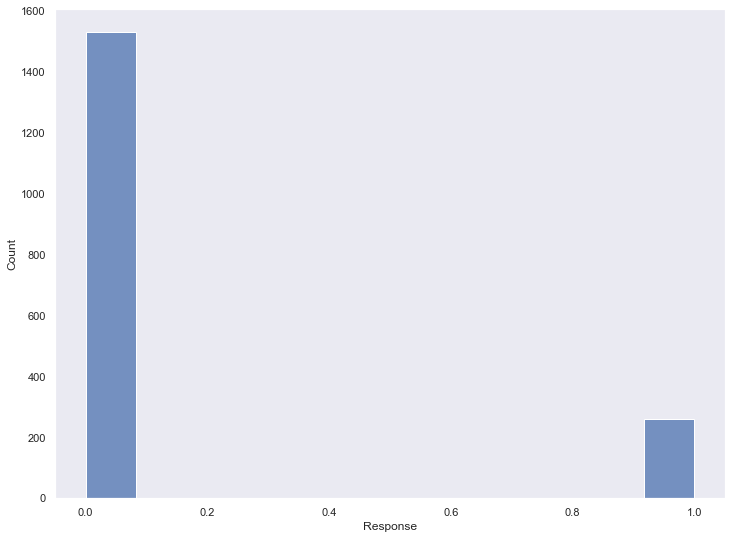

In [39]:
sns.histplot(y_train)

Class imbalance tends to skew our models real performance by misleading accuracy scores. A variety of techniques exist
- Undersampling the majority class, may lead to information loss.
- Oversampling the minority class, may lead to overfitting.

Different techniques can be tried off to optimize the model. However, in the interest of time we will use a BalanceRandomForestClassifier - BalancedRandomForestClassifier is another ensemble method in which each tree of the forest will be provided a balanced bootstrap sample. This class provides all functionality of the RandomForestClassifier, while helping us choose the sampling technique for each bootstrap level.

In [40]:
X_train

,Education,Marital_Status,Country,Kidhome,Teenhome,Recency,NumWebVisitsMonth,MntFruits,MntSweetProducts,MntMeatProducts,...,Dt_Customer:is_month_start,Dt_Customer:is_quarter_end,Dt_Customer:is_quarter_start,Dt_Customer:is_year_end,Dt_Customer:is_year_start,Dt_Customer:time,Dt_Customer:hour,Dt_Customer:minute,Dt_Customer:second,Dt_Customer:is_weekend
1700,0,0,0,0,0,75,2.0000,153,134,940,...,False,False,False,False,False,0,0,0,0,1
1085,0,1,1,0,0,48,4.0000,12,89,385,...,False,False,False,False,False,0,0,0,0,1
1748,0,2,2,1,1,77,7.0000,8,0,17,...,False,False,False,False,False,0,0,0,0,0
1848,0,2,3,1,0,82,5.0000,99,149,431,...,False,False,False,False,False,0,0,0,0,1
734,1,2,4,0,0,31,6.0000,17,8,133,...,False,False,False,False,False,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016,3,1,0,0,1,89,7.0000,15,13,27,...,False,False,False,False,False,0,0,0,0,0
656,0,1,6,1,1,28,4.0000,2,2,12,...,False,False,False,False,False,0,0,0,0,1
572,0,1,1,0,1,25,6.0000,0,7,70,...,False,False,False,False,False,0,0,0,0,0
1491,1,1,1,0,0,65,6.0000,64,64,123,...,False,False,False,False,False,0,0,0,0,0


### Classification

In [41]:
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.metrics import balanced_accuracy_score
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

brf = BalancedRandomForestClassifier(n_estimators=100, random_state=0, sampling_strategy='not minority', oob_score=False, replacement=False, n_jobs=4)
brf.fit(X_train, y_train) 

y_pred = brf.predict(X_test)
balanced_accuracy_score(y_test, y_pred)

0.7592097445038621

### Cross validation - Training Data

In [42]:
from sklearn.model_selection import cross_validate

scoring = ['precision', 'recall', 'accuracy', 'f1_weighted']
scores = cross_validate(brf, X_train, y_train, scoring=scoring, cv=5)
print('Scored for Training Data')
print('Scored for metrics: {}'.format(sorted(scores.keys())))
print('Accuracy: {}'.format(scores['test_accuracy']))
print('Recall: {}'.format(scores['test_recall']))
print('Precision: {}'.format(scores['test_precision']))
print('F1 Score: {}'.format(scores['test_f1_weighted']))

Scored for Training Data
Scored for metrics: ['fit_time', 'score_time', 'test_accuracy', 'test_f1_weighted', 'test_precision', 'test_recall']
Accuracy: [0.75766017 0.74373259 0.73743017 0.76536313 0.77653631]
Recall: [0.83018868 0.71698113 0.71153846 0.82692308 0.80769231]
Precision: [0.36065574 0.33043478 0.31896552 0.36440678 0.375     ]
F1 Score: [0.79003845 0.77657587 0.77211092 0.79672894 0.80526905]


Cross validating for precision and recall, it is pretty good in the training set, given that we are modeling imbalanced data.

## Model Evaluation:

### Confusion Matrix - Training and Test Data

Confusion Matrix Report for the Training Data


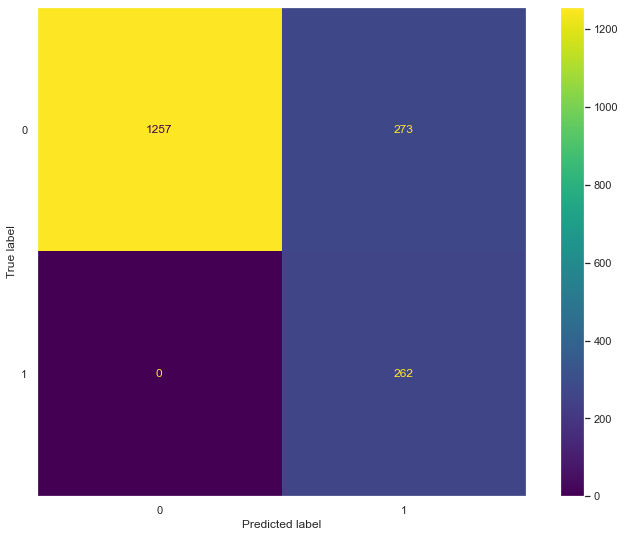

In [43]:
sns.set_style('dark')
from sklearn.metrics import confusion_matrix, plot_confusion_matrix

y_pred = brf.predict(X_train)
target_names = ['Reponse 0', 'Response 1']
print('Confusion Matrix Report for the Training Data')
plot_confusion_matrix(brf, X_train, y_train)

Confusion Matrix Report for the Test Data


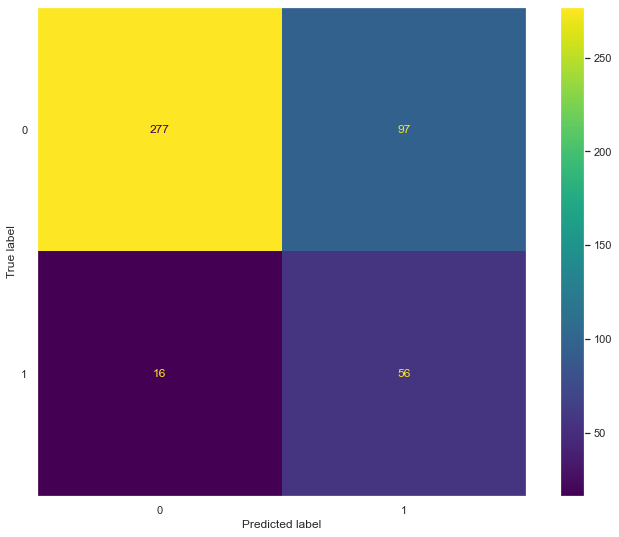

In [44]:
sns.set_style('dark')

y_pred = brf.predict(X_test)
target_names = ['Reponse 0', 'Response 1']
print('Confusion Matrix Report for the Test Data')
confusion_matrix(y_test, y_pred)
plot_confusion_matrix(brf, X_test, y_test)

### Classification Report - Training and Test Data

In [45]:
from sklearn.metrics import classification_report

y_pred = brf.predict(X_train)
target_names = ['Reponse 0', 'Response 1']
print('Classification Report for the Training Data')
print(classification_report(y_train, y_pred, target_names=target_names))

Classification Report for the Training Data
              precision    recall  f1-score   support

   Reponse 0       1.00      0.82      0.90      1530
  Response 1       0.49      1.00      0.66       262

    accuracy                           0.85      1792
   macro avg       0.74      0.91      0.78      1792
weighted avg       0.93      0.85      0.87      1792



In [46]:
y_pred = brf.predict(X_test)
target_names = ['Reponse 0', 'Response 1']
print('Classification Report for the Test Data')
print(classification_report(y_test, y_pred, target_names=target_names))

Classification Report for the Test Data
              precision    recall  f1-score   support

   Reponse 0       0.95      0.74      0.83       374
  Response 1       0.37      0.78      0.50        72

    accuracy                           0.75       446
   macro avg       0.66      0.76      0.66       446
weighted avg       0.85      0.75      0.78       446



### F1 score - Test Data

In [47]:
from sklearn.model_selection import cross_validate

scoring = ['precision', 'recall', 'accuracy', 'f1_weighted']
scores = cross_validate(brf, X_test, y_test, scoring=scoring, cv=5)
print('Scored for Test Data')
print('Scored for metrics: {}'.format(sorted(scores.keys())))
print('Accuracy: {}'.format(scores['test_accuracy']))
print('Recall: {}'.format(scores['test_recall']))
print('Precision: {}'.format(scores['test_precision']))
print('F1 Score: {}'.format(scores['test_f1_weighted']))

Scored for Test Data
Scored for metrics: ['fit_time', 'score_time', 'test_accuracy', 'test_f1_weighted', 'test_precision', 'test_recall']
Accuracy: [0.73333333 0.75280899 0.69662921 0.68539326 0.76404494]
Recall: [0.66666667 0.8        0.5        0.85714286 0.78571429]
Precision: [0.34482759 0.38709677 0.25925926 0.31578947 0.37931034]
F1 Score: [0.76203209 0.78081746 0.73033108 0.72803227 0.79209128]


### ROC curve and threshold selection - Test and Training Data

In [48]:
from sklearn.metrics import roc_curve, plot_roc_curve, confusion_matrix, plot_confusion_matrix

def get_fp_tp_pp(y, proba, threshold):
    """Return the number of false positives and true positives, along with the confusion matrix."""
    # Classify into classes based on threshold
    y_pred = pd.Series(np.where(proba>=threshold, 1, 0), dtype='int64')
    
    # Create confusion matrix
    cfm = pd.DataFrame(confusion_matrix(y, y_pred)).rename(columns={0: 'pred_0', 1: 'pred_1'}, index={0: 'actual_0', 1: 'actual_1'})
    false_positives = cfm.loc['actual_0','pred_1']
    true_positives = cfm.loc['actual_1', 'pred_1']
    positive_predictions = cfm.loc[:,'pred_1'].sum()
    return false_positives, true_positives, positive_predictions, cfm

def plot_interactive_roc_curve(df, fpr, tpr, thresholds):
    fig = px.area(
        data_frame=df, 
        x=fpr, 
        y=tpr,
        hover_data=thresholds, 
        title='ROC Curve',
    )
    fig.update_layout(
        autosize=False,
        width=900,
        height=600,
        margin=dict(l=30, r=30, b=30, t=30, pad=4),
        title_x=.5, # Centre title
        hovermode = 'closest',
        xaxis=dict(hoverformat='.4f'),
        yaxis=dict(hoverformat='.4f')
    )
    hovertemplate = 'False Positive Rate=%{x}<br>True Positive Rate=%{y}<br>Threshold=%{customdata[0]:.4f}<extra></extra>'
    fig.update_traces(hovertemplate=hovertemplate)
    
    # Add dashed line with a slope of 1
    fig.add_shape(type='line', line=dict(dash='dash'), x0=0, x1=1, y0=0, y1=1)
    fig.show()
    
def plot_interactive_precision_recall_curve(df, precision, recall, thresholds):
    fig = px.area(
        data_frame=df, 
        x=recall, 
        y=precision,
        hover_data=thresholds, 
        title='Precision-Recall Curve'
    )
    fig.update_layout(
        autosize=False,
        width=900,
        height=600,
        margin=dict(l=30, r=30, b=30, t=30, pad=4),
        title_x=.5, # Centre title
        hovermode = 'closest',
        xaxis=dict(hoverformat='.4f'),
        yaxis=dict(hoverformat='.4f')
    )
    hovertemplate = 'Recall=%{x}<br>Precision=%{y}<br>Threshold=%{customdata[0]:.4f}<extra></extra>'
    fig.update_traces(hovertemplate=hovertemplate)

    fig.show()

In [49]:
# Predict probability for training data
proba = brf.predict_proba(X_train)[:,1]

# Find fpr, tpr & pp for thresholds
negatives = np.sum(y_train==0)
positives = np.sum(y_train==1)
columns = ['threshold', 'false_positive_rate', 'true_positive_rate']
inputs_roc_prc_train = pd.DataFrame(columns=columns, dtype=np.float)
thresholds = np.linspace(0, 1, 1000)
for i, threshold in enumerate(thresholds):
    inputs_roc_prc_train.loc[i, 'threshold'] = threshold
    false_positives, true_positives, positive_predictions, cfm = get_fp_tp_pp(y_train, proba, threshold)
    inputs_roc_prc_train.loc[i, 'false_positive_rate'] = false_positives/negatives
    inputs_roc_prc_train.loc[i, 'true_positive_rate'] = true_positives/positives
    inputs_roc_prc_train.loc[i, 'precision'] = true_positives/positive_predictions
    inputs_roc_prc_train.loc[i, 'recall'] = true_positives/positives

inputs_roc_prc_train.fillna(method='ffill', inplace=True)    
inputs_roc_prc_train

,threshold,false_positive_rate,true_positive_rate,precision,recall
0,0.0000,1.0000,1.0000,0.1462,1.0000
1,0.0010,1.0000,1.0000,0.1462,1.0000
2,0.0020,1.0000,1.0000,0.1462,1.0000
3,0.0030,1.0000,1.0000,0.1462,1.0000
4,0.0040,1.0000,1.0000,0.1462,1.0000
...,...,...,...,...,...
995,0.9960,0.0000,0.0076,1.0000,0.0076
996,0.9970,0.0000,0.0076,1.0000,0.0076
997,0.9980,0.0000,0.0076,1.0000,0.0076
998,0.9990,0.0000,0.0076,1.0000,0.0076


In [50]:
# Plot ROC Curve for training data
plot_interactive_roc_curve(df=inputs_roc_prc_train, 
                           fpr='false_positive_rate', 
                           tpr='true_positive_rate', 
                           thresholds=['threshold'])

In [51]:
# Predict probability for Test data
proba = brf.predict_proba(X_test)[:,1]

# Find fpr & tpr for thresholds
negatives = np.sum(y_test==0)
positives = np.sum(y_test==1)
columns = ['threshold', 'false_positive_rate', 'true_positive_rate']
inputs_roc_prc_test = pd.DataFrame(columns=columns, dtype=np.float)
thresholds = np.linspace(0, 1, 1000)
for i, threshold in enumerate(thresholds):
    inputs_roc_prc_test.loc[i, 'threshold'] = threshold
    false_positives, true_positives, positive_predictions, cfm = get_fp_tp_pp(y_test, proba, threshold)
    inputs_roc_prc_test.loc[i, 'false_positive_rate'] = false_positives/negatives
    inputs_roc_prc_test.loc[i, 'true_positive_rate'] = true_positives/positives
    inputs_roc_prc_test.loc[i, 'precision'] = true_positives/positive_predictions
    inputs_roc_prc_test.loc[i, 'recall'] = true_positives/positives

inputs_roc_prc_test.fillna(method='ffill', inplace=True)    
# Plot ROC Curve for test data
plot_interactive_roc_curve(df=inputs_roc_prc_test, 
                           fpr='false_positive_rate', 
                           tpr='true_positive_rate', 
                           thresholds=['threshold'])

The training AUC curve seems to indicate a little bit of on overfitting happening but when we look at th AUC for an out of bag/sample prediction on completely unseen test data, the AUC is not bad at all. Comparing and contrasting the AUC on both training and test data,
- Depending on what is important to the business, we can choose the threshold.
- For e.g., in a marketing campaign, 
    - We are really not too much worried about false positives, meaning the model says user would convert from a campaign, however in reality they don't. Worst case, we would have never realized revenues from the users anway.
    - As long as the incremental cost is zero, say for e.g. emails, and we are not fatigueing our customers, we should be good to go.
    - We do want to optimize for true positives, meaning the model says a user would convert from a campaign and in reality they do. We'd lose topline revenues otherwise.
    
We can go with a threshold of ~0.4, at which point we have 90% True positive rate and 35% False positive rate.

### Precison recall curve and threshold selection - Test and Training Data

In [52]:
plot_interactive_precision_recall_curve(df=inputs_roc_prc_train, precision='precision', recall='recall', thresholds=['threshold'])

In [53]:
plot_interactive_precision_recall_curve(df=inputs_roc_prc_test, precision='precision', recall='recall', thresholds=['threshold'])

We see a similar story in the Precision - Recall curve as well. The training curve seems to indicate a little bit of on overfitting happening but when we look at it for an out of bag/sample prediction on completely unseen test data, the Precision - Recall curve is not bad at all. Recall is again, nothing but the True positive rate.
    
Given that we are thinking of a threshold ~0.4, we can find out how the precision fare against the True positive rate, by plotting the Precision, Recall and False Positve Rates against the threshold.

### ROC + Precison Recall Overlapped curve and threshold selection - Test Data

In [54]:
d_chosen_threshold = 0.4

fig = px.line(inputs_roc_prc_test, x='threshold', y=['false_positive_rate', 'precision', 'recall'], 
              title='Thresold vs FPR vs Precision vs TPR (Recall)')

fig.update_layout(
    autosize=False,
    width=900,
    height=600,
    margin=dict(l=30, r=30, b=30, t=30, pad=4),
    title_x=.5, # Centre title
    hovermode = 'closest',
    xaxis=dict(hoverformat='.4f'),
    yaxis=dict(hoverformat='.4f'),
)

fig.add_shape(type="line",
    xref="x", yref="y",
    x0=d_chosen_threshold, y0=0, x1=d_chosen_threshold, y1=1,
    line=dict(
        color="black",
        width=1,
        dash="dashdot"
    ),
)
fig.show()

When we plot the TPR, FPR and Precision against each other, by choosing a threshold of 0.4 we are getting a decent amount of precison at 25%, along with 90% True positive rate and 35% False positive rate.

### Feature Importance - Classifier

In [55]:
df_feature_importance = pd.concat([pd.Series(brf.feature_importances_, name='feature_importance'), pd.Series(brf.feature_names_in_, name='feature_names')],axis=1)
df_feature_importance.sort_values(by='feature_importance', ascending=True, inplace=True)

fig = px.bar(df_feature_importance, x="feature_importance", y="feature_names")

fig.update_layout(
    autosize=False,
    width=900,
    height=600,
    margin=dict(l=30, r=30, b=30, t=30, pad=4),
    title_x=.5, # Centre title
    hovermode = 'closest',
    xaxis=dict(hoverformat='.4f'),
    yaxis=dict(hoverformat='.4f'),
)
fig.show()

## Recommendations:

We've fixed a threshold. Our model seems legit but what does this all mean for the business of marketing to users.

Now let's say, I come to you and say,
   - Imagine there are 10 customers out there, in the real world, who'll buy from our campaigns
   - Say, for these customers, we know marital status, whether they've kids at home, their Income, the day they enrolled with us, the number of days since their last purchase with us, and the amount they have spent on wines, fruits in the last 2 years.


You say, sure here you go, let me give you that. Now what if I say,
   - I can tell you whether these customers will make a purchase with us in the next 4 campaigns. 
   - I can predict 9 out of these 10 customers to correctly make a purchase with us. 
   - Wouldn't that be valuable?

Further more,
    - Imagine I make 4 predictions, about customers, whether they will buy or not from us in the campaigns.
    - And 1 in 4 folks who were predicted to make a purchase by me, will correctly do so.

Wouldn't that be cool :)?